In [119]:
import json
import os
import numpy as np
import requests
import pandas as pd
from bs4 import BeautifulSoup
import re
from docx import Document
from docx.shared import Pt
import pickle
import os
from tqdm import tqdm
import time
from langdetect import detect
import matplotlib.pyplot as plt
import collections
from IPython.display import display
import spacy
import spacy.cli
from spacy.language import Language
import math

from IPython.display import display
import nltk

from transformers import BertTokenizer
import seaborn as sns
from tabulate import tabulate
import prettytable
from prettytable import PrettyTable
from textwrap import fill

from matplotlib import ticker
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

In [120]:
def get_num_of_sents(lista_udienze):
    
    tot_frasi = 0
    
    for udienza in lista_udienze:
        sents = nltk.sent_tokenize(udienza, language='italian')
        tot_frasi += len(sents)
        
        
    return tot_frasi

In [121]:
def get_average_speech_length_in_words(num_udienze, lista_frasi):
    
    words = []
    
    #for udienza in lista_udienze:
        #sents = nltk.sent_tokenize(udienza, language='italian')
    for sent in lista_frasi:
        words.extend(nltk.word_tokenize(sent))
        
    return "%.4f" %(len(words)/num_udienze)

In [122]:
def get_average_speech_length_in_sents(num_udienze, numero_frasi):
    
    #sents = []
    
    #for udienza in lista_udienze:
       # sents.extend(nltk.sent_tokenize(udienza, language='italian'))
        
    return "%.4f" %(numero_frasi/num_udienze)

In [123]:
def get_general_statistics(num_udienze, list_of_sentences):
    
    diz_metrics = {}
    words = []
    
    for sent in list_of_sentences:
        words.extend(nltk.word_tokenize(sent))
        
    vocabolario = list(set([w.lower() for w in words]))
    
    diz_metrics['total_number_of_speeches'] = num_udienze
    diz_metrics['total_number_of_sentences'] = len(list_of_sentences)
    diz_metrics['total_number_of_tokens'] = len(words)
    diz_metrics['total_number_of_types'] = len(vocabolario)
    
    return diz_metrics

In [124]:
def get_average_sentence_length(list_of_sentences):
    
    words = []
    
    for sent in list_of_sentences:
        words.extend(nltk.word_tokenize(sent))
        
    return "%.4f" %(len(words)/len(list_of_sentences))

In [125]:
def get_TTR(list_of_sentences):
    
    words = []
    
    for sent in list_of_sentences:
        words.extend(nltk.word_tokenize(sent))
        
    num_of_type = list(set([w.lower() for w in words]))
        
    return "%.4f" %(len(num_of_type)/len(words))

In [126]:
def get_TTR_of_speech(udienze, lista_frasi):
    
    ttr_list = []
    
    for udienza in udienze:
        words = []
        #sents = nltk.sent_tokenize(udienza, language='italian')
        #for sent in sents:
        for sent in udienze[udienza]:
            words.extend(nltk.word_tokenize(sent))
            
        num_of_type = list(set([w.lower() for w in words]))
        ttr = len(num_of_type)/len(words)
        ttr_list.append(ttr)
        
    return "%.4f" %(sum(ttr_list)/len(udienze.keys()))

In [127]:
def get_average_pos(list_of_sentences, granularity, num_udienze):
    
    """
    Calcolo quante pos ci sono in media in ogni frase
    """
    
    diz_pos = {}
    
    for sent in tqdm(list_of_sentences):
        
        #processo la frase con spacy
        processed_sent = nlp(sent)
        
        #calcolo quante volte appare ogni possibile parte del discorso (PoS)
        diz_pos_sent = collections.Counter([w.pos_ for w in processed_sent])
        
        #aggiorno il dizionario generale delle PoS
        for pos in diz_pos_sent:
            if pos not in diz_pos:
                diz_pos[pos] = diz_pos_sent[pos]
            else:
                diz_pos[pos] += diz_pos_sent[pos]
                
    #una volta che ho il conteggio totale di ogni PoS, calcolo quante ce ne sono in media in ogni frase dividendo
    #il numero totale di ogni PoS per il numero complessivo di frasi
    diz_average_pos = {}
    
    for pos in diz_pos:
        value = ''
        if granularity == 'sentences':
            value = "%.4f" % (diz_pos[pos] / len(list_of_sentences))
        else:
            value = "%.4f" % (diz_pos[pos] / num_udienze)
            
        k = ''
        
        if granularity == 'sentences':
            k = pos + " (media)"
        else:
            k = pos + "_ud" + " (media)"
        
        diz_average_pos[k] = value
        
        
    return diz_pos, diz_average_pos

In [128]:
def pretty_table(dct, source):
    
    table = PrettyTable(header=False, align='l', hrules=prettytable.ALL)
    #table = PrettyTable()
    for c in dct.keys():
        table.add_row([c, dct[c][0]])
    
    table.title = 'General statistics of {} sentences'.format(source)
    
    return table

In [129]:
nltk.download('punkt')
nltk.data.load('tokenizers/punkt/italian.pickle')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/eleonoracocciu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [130]:
nlp = spacy.load('it_core_news_lg')
nlp.max_length = 150000

/opt/anaconda3/lib/python3.8/site-packages/spacy/util.py:877: UserWarning: [W095] Model 'it_core_news_lg' (3.2.0) was trained with spaCy v3.2 and may not be 100% compatible with the current version (3.4.4). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


# Risorsa

In [131]:
path_dataset = "../dataset/"

In [132]:
path_pickle = "../pickle/"

In [133]:
path_images = "../plots/"

In [134]:
os.getcwd()+"/"+path_dataset

'/Users/eleonoracocciu/Desktop/TESI_magistrale/ParlaMint-IT/notebook/../dataset/'

In [135]:
diz_flussi_udienze_ripulite = {}

for filename in os.listdir(os.getcwd()+"/"+path_dataset):
    if "ripulite" in filename:
        diz_flussi_udienze_ripulite[filename] = pd.read_csv(path_dataset+filename, sep="\t")

In [136]:
lista_anni = [str(i) for i in range(2013, 2021)]
lista_anni

['2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020']

In [137]:
diz = open(path_pickle + "dizionario_interventi_per_anno.pickle", "rb")
dizionario_interventi_per_anno = pickle.load(diz)

In [138]:
for filename, anno in zip(sorted(list(diz_flussi_udienze_ripulite.keys())), lista_anni):
    lista_udienze = list(diz_flussi_udienze_ripulite[filename]['Udienze ripulite'])
    print(filename, " - ", anno, "\t", \
          len(dizionario_interventi_per_anno[anno]['lista_frasi_totali_flatten']), " - ", get_num_of_sents(lista_udienze))

Udienze_ParlaMint_ripulite_2013.csv  -  2013 	 48057  -  48057
Udienze_ParlaMint_ripulite_2014.csv  -  2014 	 70871  -  70871
Udienze_ParlaMint_ripulite_2015.csv  -  2015 	 73925  -  73925
Udienze_ParlaMint_ripulite_2016.csv  -  2016 	 65352  -  65352
Udienze_ParlaMint_ripulite_2017.csv  -  2017 	 63461  -  63461
Udienze_ParlaMint_ripulite_2018.csv  -  2018 	 29692  -  29692
Udienze_ParlaMint_ripulite_2019.csv  -  2019 	 46507  -  46507
Udienze_ParlaMint_ripulite_2020.csv  -  2020 	 36731  -  36731


In [139]:
" ".join(dizionario_interventi_per_anno['2013']['interventi']['intervento_3'])

"L'ordine del giorno reca il seguito della discussione del disegno di legge n. 1015. Ricordo che nella seduta di ieri è stata data lettura dei pareri della 1ᵃ e dalla 5ᵃ Commissione permanente e, su richiesta del relatore, l'Assemblea ha convenuto di rinviare il seguito della discussione alla seduta odierna. Invito il senatore Segretario a dare lettura dell'ulteriore parere espresso dalla 5ᵃ Commissione permanente sugli emendamenti."

In [140]:
list([" ".join(dizionario_interventi_per_anno['2013']['interventi'][intervento]) \
               for intervento in dizionario_interventi_per_anno['2013']['interventi']])

["L'elenco dei senatori in congedo e assenti per incarico ricevuto dal Senato, nonché ulteriori comunicazioni all'Assemblea saranno pubblicati nell'allegato B al Resoconto della seduta odierna.",
 "Avverto che nel corso della seduta odierna potranno essere effettuate votazioni qualificate mediante il procedimento elettronico. Pertanto decorre da questo momento il termine di venti minuti dal preavviso previsto dall'articolo 119, comma 1, del Regolamento.",
 'Nessuno al banco della Presidenza - io stavo leggendo - ha rilevato la sua richiesta. Le chiedo scusa. Magari la prossima volta formuli i suoi rilievi immediatamente, ma ora il processo verbale è già stato approvato.',
 "L'ordine del giorno reca il seguito della discussione del disegno di legge n. 1015. Ricordo che nella seduta di ieri è stata data lettura dei pareri della 1ᵃ e dalla 5ᵃ Commissione permanente e, su richiesta del relatore, l'Assemblea ha convenuto di rinviare il seguito della discussione alla seduta odierna. Invito i

In [141]:
len(diz_flussi_udienze_ripulite['Udienze_ParlaMint_ripulite_2013.csv']['Udienze ripulite'])

7506

In [142]:
len(dizionario_interventi_per_anno['2013']['lista_frasi_totali_flatten'])

48057

In [143]:
prova = []

for udienza in diz_flussi_udienze_ripulite['Udienze_ParlaMint_ripulite_2013.csv']['Udienze ripulite']:
    prova.extend(nltk.sent_tokenize(udienza, language='italian'))

In [144]:
len(prova)

48057

In [145]:
prova2 = []

for f in prova:
    prova2.extend(nltk.word_tokenize(f))

In [146]:
len(prova2)

1562819

In [147]:
get_general_statistics(list(dizionario_interventi_per_anno['2013']['interventi'].keys()), \
                       dizionario_interventi_per_anno['2013']['lista_frasi_totali_flatten'])

{'total_number_of_speeches': ['intervento_0',
  'intervento_1',
  'intervento_2',
  'intervento_3',
  'intervento_4',
  'intervento_5',
  'intervento_6',
  'intervento_7',
  'intervento_8',
  'intervento_9',
  'intervento_10',
  'intervento_11',
  'intervento_12',
  'intervento_13',
  'intervento_14',
  'intervento_15',
  'intervento_16',
  'intervento_17',
  'intervento_18',
  'intervento_19',
  'intervento_20',
  'intervento_21',
  'intervento_22',
  'intervento_23',
  'intervento_24',
  'intervento_25',
  'intervento_26',
  'intervento_27',
  'intervento_28',
  'intervento_29',
  'intervento_30',
  'intervento_31',
  'intervento_32',
  'intervento_33',
  'intervento_34',
  'intervento_35',
  'intervento_36',
  'intervento_37',
  'intervento_38',
  'intervento_39',
  'intervento_40',
  'intervento_41',
  'intervento_42',
  'intervento_43',
  'intervento_44',
  'intervento_45',
  'intervento_46',
  'intervento_47',
  'intervento_48',
  'intervento_49',
  'intervento_50',
  'intervento

In [148]:
get_general_statistics(diz_flussi_udienze_ripulite['Udienze_ParlaMint_ripulite_2013.csv']['Udienze ripulite'], \
                       dizionario_interventi_per_anno['2013']['lista_frasi_totali_flatten'])

{'total_number_of_speeches': 0       L'elenco dei senatori in congedo e assenti per...
 1       Avverto che nel corso della seduta odierna pot...
 2       Nessuno al banco della Presidenza - io stavo l...
 3       L'ordine del giorno reca il seguito della disc...
 4       «La Commissione programmazione economica, bila...
                               ...                        
 7501    Signora Presidente, signor Sottosegretario, so...
 7502    Lo svolgimento delle interpellanze e delle int...
 7503    Signora Presidente, intervengo per richiamare ...
 7504    Le mozioni, interpellanze e interrogazioni per...
 7505    Il Senato tornerà a riunirsi in seduta pubblic...
 Name: Udienze ripulite, Length: 7506, dtype: object,
 'total_number_of_sentences': 48057,
 'total_number_of_tokens': 1562738,
 'total_number_of_types': 46743}

# Statistiche generali e delle PoS per frasi e udienze

In [149]:
diz_statistiche_per_anno = {}
lista_udienze_anni = {}

# per ogni anno
for anno in sorted(lista_anni):
    
    print("{}".format(anno))
    
    #lista_udienze = list(diz_flussi_udienze_ripulite[filename]['Udienze ripulite'])
    # prendo le udienze dal dizionario degli interventi per anno
    #lista_udienze = list([" ".join(dizionario_interventi_per_anno[anno]['interventi'][intervento]) \
    #           for intervento in dizionario_interventi_per_anno[anno]['interventi']])
    
    #lista_udienze_anni[anno] = lista_udienze
    
    num_udienze = len(dizionario_interventi_per_anno[anno]['interventi'].keys())
    
    lista_frasi = dizionario_interventi_per_anno[anno]['lista_frasi_totali_flatten']
    
    # calcolo le statistiche generali e le statistiche delle PoS, a livello di udienze e di frasi
    diz_general_statistics = get_general_statistics(num_udienze, lista_frasi)
    diz_pos_udienze, diz_average_pos_udienze = get_average_pos(lista_frasi, 'udienze', num_udienze)
    diz_pos, diz_average_pos_sentences = get_average_pos(lista_frasi, 'sentences', '')
    
    diz_statistiche_per_anno[anno] = {}
    diz_statistiche_per_anno[anno]['diz_general_statistics'] = diz_general_statistics
    diz_statistiche_per_anno[anno]['diz_average_pos_udienze'] = diz_average_pos_udienze
    diz_statistiche_per_anno[anno]['diz_average_pos_sentences'] = diz_average_pos_sentences

2013


100%|█████████████████████████████████████| 48057/48057 [08:04<00:00, 99.10it/s]


2014


100%|████████████████████████████████████| 70871/70871 [11:02<00:00, 106.96it/s]


2015


100%|████████████████████████████████████| 73925/73925 [11:21<00:00, 108.51it/s]


2016


100%|████████████████████████████████████| 65352/65352 [10:05<00:00, 107.86it/s]


2017


100%|████████████████████████████████████| 63461/63461 [09:44<00:00, 108.52it/s]


2018


100%|████████████████████████████████████| 29692/29692 [04:36<00:00, 107.47it/s]


2019


100%|████████████████████████████████████| 46507/46507 [07:09<00:00, 108.17it/s]


2020


100%|████████████████████████████████████| 36731/36731 [05:51<00:00, 104.63it/s]


In [150]:
diz_statistiche_per_anno

{'2013': {'diz_general_statistics': {'total_number_of_speeches': 7506,
   'total_number_of_sentences': 48057,
   'total_number_of_tokens': 1562738,
   'total_number_of_types': 46743},
  'diz_average_pos_udienze': {'DET_ud (media)': '21.3064',
   'NOUN_ud (media)': '46.4932',
   'ADP_ud (media)': '35.7634',
   'CCONJ_ud (media)': '6.6236',
   'ADJ_ud (media)': '14.6631',
   'VERB_ud (media)': '20.7748',
   'PUNCT_ud (media)': '23.7822',
   'PROPN_ud (media)': '4.9001',
   'AUX_ud (media)': '9.3959',
   'SCONJ_ud (media)': '3.5545',
   'ADV_ud (media)': '11.6485',
   'NUM_ud (media)': '3.3784',
   'PRON_ud (media)': '10.5037',
   'INTJ_ud (media)': '0.0397',
   'X_ud (media)': '0.0589',
   'SYM_ud (media)': '0.0044',
   'PART_ud (media)': '0.0007'},
  'diz_average_pos_sentences': {'DET (media)': '3.3278',
   'NOUN (media)': '7.2618',
   'ADP (media)': '5.5859',
   'CCONJ (media)': '1.0345',
   'ADJ (media)': '2.2902',
   'VERB (media)': '3.2448',
   'PUNCT (media)': '3.7145',
   'PROPN (

In [151]:
with open('{}diz_statistiche_per_anno.pickle'.format(path_pickle), 'wb') as handle:
     pickle.dump(diz_statistiche_per_anno, handle)

In [39]:
len(dizionario_interventi_per_anno['2013']['interventi'].keys())

7506

In [24]:
#diz_statistiche_per_anno

{'2013': {'diz_general_statistics': {'total_number_of_speeches': 7506,
   'total_number_of_sentences': 48057,
   'total_number_of_tokens': 1562738,
   'total_number_of_types': 46743},
  'diz_average_pos_udienze': {'DET_ud (media)': '21.3064',
   'NOUN_ud (media)': '46.4932',
   'ADP_ud (media)': '35.7634',
   'CCONJ_ud (media)': '6.6236',
   'ADJ_ud (media)': '14.6631',
   'VERB_ud (media)': '20.7748',
   'PUNCT_ud (media)': '23.7822',
   'PROPN_ud (media)': '4.9001',
   'AUX_ud (media)': '9.3959',
   'SCONJ_ud (media)': '3.5545',
   'ADV_ud (media)': '11.6485',
   'NUM_ud (media)': '3.3784',
   'PRON_ud (media)': '10.5037',
   'INTJ_ud (media)': '0.0397',
   'X_ud (media)': '0.0589',
   'SYM_ud (media)': '0.0044',
   'PART_ud (media)': '0.0007'},
  'diz_average_pos_sentences': {'DET (media)': '3.3278',
   'NOUN (media)': '7.2618',
   'ADP (media)': '5.5859',
   'CCONJ (media)': '1.0345',
   'ADJ (media)': '2.2902',
   'VERB (media)': '3.2448',
   'PUNCT (media)': '3.7145',
   'PROPN (

# Tabelle con metriche (per udienze e frasi)

In [ ]:
get_average_speech_length_in_sents(num_udienze, numero_frasi)
get_average_speech_length_in_words(num_udienze, lista_frasi)
get_TTR_of_speech(udienze, lista_frasi)
get_average_sentence_length(list_of_sentences)
get_TTR(list_of_sentences)

In [152]:
def get_year_statistics_table(diz_year_table_statistics, dizionario_interventi_per_anno, anno):
    
    udienze = dizionario_interventi_per_anno[anno]['interventi']
    num_udienze = len(udienze.keys())
    lista_frasi = dizionario_interventi_per_anno[anno]['lista_frasi_totali_flatten']
    numero_frasi = len(lista_frasi)
        
    diz_table_statistics = {

        #general statistics
        'N. udienze' : diz_year_table_statistics['diz_general_statistics']['total_number_of_speeches'], \
        'N. frasi' : diz_year_table_statistics['diz_general_statistics']['total_number_of_sentences'], \
        'N. tokens' : diz_year_table_statistics['diz_general_statistics']['total_number_of_tokens'], \
        'Vocabolario' : diz_year_table_statistics['diz_general_statistics']['total_number_of_types'], \

        #average statistics (udienze)
        #'Lunghezza media delle udienze in frasi' : get_average_speech_length_in_sents(lista_udienze_anni[anno]), \
        #'Lunghezza media delle udienze in parole' : get_average_speech_length_in_words(lista_udienze_anni[anno]), \
        #'TTR (ricchezza lessicale) udienze' : get_TTR_of_speech(lista_udienze_anni[anno])
        
        'Lunghezza media delle udienze in frasi' : get_average_speech_length_in_sents(num_udienze, numero_frasi), \
        'Lunghezza media delle udienze in parole' : get_average_speech_length_in_words(num_udienze, lista_frasi), \
        'TTR (ricchezza lessicale) udienze' : get_TTR_of_speech(udienze, lista_frasi), \
        **diz_year_table_statistics['diz_average_pos_udienze'], \

        #average statistics (sentences)
        'Lunghezza media delle frasi(parole)' : get_average_sentence_length(lista_frasi), \
        'TTR (ricchezza lessicale)' : get_TTR(lista_frasi), \
        **diz_year_table_statistics['diz_average_pos_sentences']

    }
    
    return diz_table_statistics

In [153]:
diz_tabelle_anni = {}

In [154]:
for anno in diz_statistiche_per_anno:
    
    print(anno)
    print()
    
    t = get_year_statistics_table(diz_statistiche_per_anno[anno], \
                                  dizionario_interventi_per_anno, anno)
    
    diz_tabelle_anni[anno] = t
    
    print(tabulate(t.items(), headers="keys", tablefmt='latex', floatfmt=".2f"))
    print()
    #table = pretty_table(t, 'ParlaMint')
    
    #print(table)
    
    print("------------------------------------------------------------------------------------------------------")
    print()

2013

\begin{tabular}{lr}
\hline
 0                                       &          1 \\
\hline
 N. udienze                              &    7506.00 \\
 N. frasi                                &   48057.00 \\
 N. tokens                               & 1562738.00 \\
 Vocabolario                             &   46743.00 \\
 Lunghezza media delle udienze in frasi  &       6.40 \\
 Lunghezza media delle udienze in parole &     208.20 \\
 TTR (ricchezza lessicale) udienze       &       0.77 \\
 DET\_ud (media)                          &      21.31 \\
 NOUN\_ud (media)                         &      46.49 \\
 ADP\_ud (media)                          &      35.76 \\
 CCONJ\_ud (media)                        &       6.62 \\
 ADJ\_ud (media)                          &      14.66 \\
 VERB\_ud (media)                         &      20.77 \\
 PUNCT\_ud (media)                        &      23.78 \\
 PROPN\_ud (media)                        &       4.90 \\
 AUX\_ud (media)                        

\begin{tabular}{lr}
\hline
 0                                       &          1 \\
\hline
 N. udienze                              &    7871.00 \\
 N. frasi                                &   65352.00 \\
 N. tokens                               & 2040391.00 \\
 Vocabolario                             &   53005.00 \\
 Lunghezza media delle udienze in frasi  &       8.30 \\
 Lunghezza media delle udienze in parole &     259.23 \\
 TTR (ricchezza lessicale) udienze       &       0.72 \\
 NOUN\_ud (media)                         &      57.44 \\
 PUNCT\_ud (media)                        &      28.84 \\
 VERB\_ud (media)                         &      26.42 \\
 DET\_ud (media)                          &      26.60 \\
 ADP\_ud (media)                          &      44.13 \\
 ADJ\_ud (media)                          &      18.28 \\
 CCONJ\_ud (media)                        &       8.58 \\
 PROPN\_ud (media)                        &       5.84 \\
 AUX\_ud (media)                          &   

\begin{tabular}{lr}
\hline
 0                                       &          1 \\
\hline
 N. udienze                              &    3331.00 \\
 N. frasi                                &   36731.00 \\
 N. tokens                               & 1163091.00 \\
 Vocabolario                             &   39315.00 \\
 Lunghezza media delle udienze in frasi  &      11.03 \\
 Lunghezza media delle udienze in parole &     349.17 \\
 TTR (ricchezza lessicale) udienze       &       0.69 \\
 DET\_ud (media)                          &      36.16 \\
 NOUN\_ud (media)                         &      75.67 \\
 ADP\_ud (media)                          &      57.62 \\
 CCONJ\_ud (media)                        &      11.90 \\
 ADJ\_ud (media)                          &      23.90 \\
 VERB\_ud (media)                         &      35.63 \\
 PUNCT\_ud (media)                        &      39.48 \\
 PROPN\_ud (media)                        &       7.89 \\
 AUX\_ud (media)                          &   

### Questo

In [74]:
diz_tabelle_anni

{'2013': {'N. udienze': 7506,
  'N. frasi': 48057,
  'N. tokens': 1562738,
  'Vocabolario': 46743,
  'Lunghezza media delle udienze in frasi': '6.4025',
  'Lunghezza media delle udienze in parole': '208.1985',
  'TTR (ricchezza lessicale) udienze': '0.7661',
  'DET_ud (media)': '21.3064',
  'NOUN_ud (media)': '46.4932',
  'ADP_ud (media)': '35.7634',
  'CCONJ_ud (media)': '6.6236',
  'ADJ_ud (media)': '14.6631',
  'VERB_ud (media)': '20.7748',
  'PUNCT_ud (media)': '23.7822',
  'PROPN_ud (media)': '4.9001',
  'AUX_ud (media)': '9.3959',
  'SCONJ_ud (media)': '3.5545',
  'ADV_ud (media)': '11.6485',
  'NUM_ud (media)': '3.3784',
  'PRON_ud (media)': '10.5037',
  'INTJ_ud (media)': '0.0397',
  'X_ud (media)': '0.0589',
  'SYM_ud (media)': '0.0044',
  'PART_ud (media)': '0.0007',
  'Lunghezza media delle frasi(parole)': '32.5184',
  'TTR (ricchezza lessicale)': '0.0299',
  'DET (media)': '3.3278',
  'NOUN (media)': '7.2618',
  'ADP (media)': '5.5859',
  'CCONJ (media)': '1.0345',
  'ADJ (

In [30]:
for anno in diz_statistiche_per_anno:
    
    print(anno)
    print()
    
    t = get_year_statistics_table(diz_statistiche_per_anno[anno], \
                                  dizionario_interventi_per_anno[anno], lista_udienze_anni, anno)
    
    print(tabulate(t.items(), headers="keys", tablefmt='latex'))
    print()
    #table = pretty_table(t, 'ParlaMint')
    
    #print(table)
    
    print("------------------------------------------------------------------------------------------------------")
    print()

2013

\begin{tabular}{lr}
\hline
 0                                       &               1 \\
\hline
 N. udienze                              &  7506           \\
 N. frasi                                & 48057           \\
 N. tokens                               &     1.56274e+06 \\
 Vocabolario                             & 46743           \\
 Lunghezza media delle udienze in frasi  &     6.4025      \\
 Lunghezza media delle udienze in parole &   208.198       \\
 TTR (ricchezza lessicale) udienze       &     0.7661      \\
 DET\_ud (media)                          &    21.3064      \\
 NOUN\_ud (media)                         &    46.4932      \\
 ADP\_ud (media)                          &    35.7634      \\
 CCONJ\_ud (media)                        &     6.6236      \\
 ADJ\_ud (media)                          &    14.6631      \\
 VERB\_ud (media)                         &    20.7748      \\
 PUNCT\_ud (media)                        &    23.7822      \\
 PROPN\_ud (media)     

\begin{tabular}{lr}
\hline
 0                                       &               1 \\
\hline
 N. udienze                              &  7871           \\
 N. frasi                                & 65352           \\
 N. tokens                               &     2.04039e+06 \\
 Vocabolario                             & 53005           \\
 Lunghezza media delle udienze in frasi  &     8.3029      \\
 Lunghezza media delle udienze in parole &   259.229       \\
 TTR (ricchezza lessicale) udienze       &     0.7232      \\
 NOUN\_ud (media)                         &    57.4358      \\
 PUNCT\_ud (media)                        &    28.8432      \\
 VERB\_ud (media)                         &    26.4208      \\
 DET\_ud (media)                          &    26.5967      \\
 ADP\_ud (media)                          &    44.1325      \\
 ADJ\_ud (media)                          &    18.2814      \\
 CCONJ\_ud (media)                        &     8.5829      \\
 PROPN\_ud (media)           

\begin{tabular}{lr}
\hline
 0                                       &               1 \\
\hline
 N. udienze                              &  5367           \\
 N. frasi                                & 46507           \\
 N. tokens                               &     1.37948e+06 \\
 Vocabolario                             & 44439           \\
 Lunghezza media delle udienze in frasi  &     8.665       \\
 Lunghezza media delle udienze in parole &   257.031       \\
 TTR (ricchezza lessicale) udienze       &     0.709       \\
 DET\_ud (media)                          &    26.0518      \\
 NOUN\_ud (media)                         &    57.4179      \\
 ADP\_ud (media)                          &    43.7742      \\
 CCONJ\_ud (media)                        &     8.3879      \\
 ADJ\_ud (media)                          &    17.9229      \\
 VERB\_ud (media)                         &    26.1627      \\
 PUNCT\_ud (media)                        &    29.3058      \\
 PROPN\_ud (media)           

In [155]:
def get_year_statistics_table_ridotta(diz_year_table_statistics, dizionario_interventi_per_anno, anno):
    
    udienze = dizionario_interventi_per_anno[anno]['interventi']
    num_udienze = len(udienze.keys())
    lista_frasi = dizionario_interventi_per_anno[anno]['lista_frasi_totali_flatten']
    numero_frasi = len(lista_frasi)
        
    diz_table_statistics = {

        #general statistics
        'N. udienze' : diz_year_table_statistics['diz_general_statistics']['total_number_of_speeches'], \
        'N. frasi' : diz_year_table_statistics['diz_general_statistics']['total_number_of_sentences'], \
        'N. tokens' : diz_year_table_statistics['diz_general_statistics']['total_number_of_tokens'], \
        'Vocabolario' : diz_year_table_statistics['diz_general_statistics']['total_number_of_types'], \

        #average statistics (udienze)
        #'Lunghezza media delle udienze in frasi' : get_average_speech_length_in_sents(lista_udienze_anni[anno]), \
        #'Lunghezza media delle udienze in parole' : get_average_speech_length_in_words(lista_udienze_anni[anno]), \
        #'TTR (ricchezza lessicale) udienze' : get_TTR_of_speech(lista_udienze_anni[anno]), \
        
        'Lunghezza media delle udienze in frasi' : get_average_speech_length_in_sents(num_udienze, numero_frasi), \
        'Lunghezza media delle udienze in parole' : get_average_speech_length_in_words(num_udienze, lista_frasi), \
        'TTR (ricchezza lessicale) udienze' : get_TTR_of_speech(udienze, lista_frasi), \

        #average statistics (sentences)
        'Lunghezza media delle frasi(parole)' : get_average_sentence_length(lista_frasi), \
        'TTR (ricchezza lessicale)' : get_TTR(lista_frasi), \

    }
    
    lista_chiavi_generali_da_tenere = ['N. frasi', 'N. tokens', 'Vocabolario', 'Lunghezza media delle frasi(parole)',
                          'TTR (ricchezza lessicale)']
    lista_pos_da_tenere = ['VERB', 'NOUN', 'PRON', 'ADJ', 'ADV', 'PUNCT', 'PROPN']

    for k in diz_year_table_statistics['diz_average_pos_udienze']:
        for pos in lista_pos_da_tenere:
            if k.startswith(pos):
                diz_table_statistics[k] = diz_year_table_statistics['diz_average_pos_udienze'][k]
    
    for k in diz_year_table_statistics['diz_average_pos_sentences']:
        for pos in lista_pos_da_tenere:
            if k.startswith(pos):
                diz_table_statistics[k] = diz_year_table_statistics['diz_average_pos_sentences'][k]
    
    return diz_table_statistics

In [156]:
diz_tabelle_anni_ridotte = {}

In [157]:
for anno in diz_statistiche_per_anno:
    
    print(anno)
    print()
    
    t = get_year_statistics_table_ridotta(diz_statistiche_per_anno[anno], \
                                  dizionario_interventi_per_anno, anno)
    
    diz_tabelle_anni_ridotte[anno] = t
    
    print(tabulate(t.items(), headers="keys", tablefmt='latex'))
    print()
    #table = pretty_table(t, 'ParlaMint')
    
    #print(table)
    
    print("------------------------------------------------------------------------------------------------------")
    print()

2013

\begin{tabular}{lr}
\hline
 0                                       &               1 \\
\hline
 N. udienze                              &  7506           \\
 N. frasi                                & 48057           \\
 N. tokens                               &     1.56274e+06 \\
 Vocabolario                             & 46743           \\
 Lunghezza media delle udienze in frasi  &     6.4025      \\
 Lunghezza media delle udienze in parole &   208.198       \\
 TTR (ricchezza lessicale) udienze       &     0.7661      \\
 Lunghezza media delle frasi(parole)     &    32.5184      \\
 TTR (ricchezza lessicale)               &     0.0299      \\
 NOUN\_ud (media)                         &    46.4932      \\
 ADJ\_ud (media)                          &    14.6631      \\
 VERB\_ud (media)                         &    20.7748      \\
 PUNCT\_ud (media)                        &    23.7822      \\
 PROPN\_ud (media)                        &     4.9001      \\
 ADV\_ud (media)         

\begin{tabular}{lr}
\hline
 0                                       &           1 \\
\hline
 N. udienze                              &   3650      \\
 N. frasi                                &  29692      \\
 N. tokens                               & 870417      \\
 Vocabolario                             &  34517      \\
 Lunghezza media delle udienze in frasi  &      8.1348 \\
 Lunghezza media delle udienze in parole &    238.47   \\
 TTR (ricchezza lessicale) udienze       &      0.7152 \\
 Lunghezza media delle frasi(parole)     &     29.3149 \\
 TTR (ricchezza lessicale)               &      0.0397 \\
 NOUN\_ud (media)                         &     53.2079 \\
 ADJ\_ud (media)                          &     16.1115 \\
 VERB\_ud (media)                         &     24.6932 \\
 PUNCT\_ud (media)                        &     27.4786 \\
 PROPN\_ud (media)                        &      5.9395 \\
 PRON\_ud (media)                         &     12.1173 \\
 ADV\_ud (media)                

### Questo

In [65]:
diz_tabelle_anni_ridotte

{'2013': {'N. udienze': 7506,
  'N. frasi': 48057,
  'N. tokens': 1562738,
  'Vocabolario': 46743,
  'Lunghezza media delle udienze in frasi': '6.4025',
  'Lunghezza media delle udienze in parole': '208.1985',
  'TTR (ricchezza lessicale) udienze': '0.7661',
  'Lunghezza media delle frasi(parole)': '32.5184',
  'TTR (ricchezza lessicale)': '0.0299',
  'NOUN_ud (media)': '46.4932',
  'ADJ_ud (media)': '14.6631',
  'VERB_ud (media)': '20.7748',
  'PUNCT_ud (media)': '23.7822',
  'PROPN_ud (media)': '4.9001',
  'ADV_ud (media)': '11.6485',
  'PRON_ud (media)': '10.5037',
  'NOUN (media)': '7.2618',
  'ADJ (media)': '2.2902',
  'VERB (media)': '3.2448',
  'PUNCT (media)': '3.7145',
  'PROPN (media)': '0.7653',
  'ADV (media)': '1.8194',
  'PRON (media)': '1.6406'},
 '2014': {'N. udienze': 9753,
  'N. frasi': 70871,
  'N. tokens': 2240430,
  'Vocabolario': 55230,
  'Lunghezza media delle udienze in frasi': '7.2666',
  'Lunghezza media delle udienze in parole': '229.7170',
  'TTR (ricchezza 

2013:
N. frasi: 48057
gli interventi hanno in media 6-7 frasi, quindi non sono molto lunghi.
le udienze risultano molto ricche lessicalmente (considerando che le frasi non sono molte), mentre le frasi no, questo indica che, complessivamente, non ci sono molti termini diversi, ma si ripetono nel corso delle frasi.
la parte del discorso più utilizzata sono i nomi, seguiti da verbi e punteggiatura, con una buona presenza di aggettivi.

2014:
N. frasi: 70871
gli interventi hanno in media 7 frasi, quindi non sono molto lunghi.
le udienze risultano abbastanza ricche lessicalmente, mentre le frasi no, questo indica che, complessivamente, non ci sono molti termini diversi, ma si ripetono nel corso delle frasi.
la parte del discorso più utilizzata sono i nomi, seguiti da verbi e punteggiatura, con una buona presenza di aggettivi.

2015:
N. frasi: 73925
lunghezza media delle udienze in frasi: 8.
udienze abbastanza ricche, frasi no. per le pos come prima

2016:
N. frasi: 65352
lunghezza media delle udienze in frasi: 8.
udienze ricche, frasi nno. Per le pos come prima.

2017:
N. frasi: 63461
lunghezza media delle udienze in frasi: 8-9.
TTR delle udienze abbastanza alto, per frasi no.
Per lo pos come prima.

2018:
'N. frasi': 29692
lunghezza media delle udienze in frasi: 8.
'TTR (ricchezza lessicale) udienze': '0.7152',
'TTR (ricchezza lessicale)': '0.0397',
TTR delle molto alto, consierando che sono poche le frasi; per frasi no.
la parte del discorso più utilizzata sono i nomi, seguiti da punteggiatura e verbi.

2019:
'N. frasi': 46507
lunghezza media delle udienze in frasi: 8-9.
TTR delle udienze abbastanza alto, per frasi no.
Per lo pos come prima.

2020:
'N. frasi': 36731
'Lunghezza media delle udienze in frasi': '11'
'TTR (ricchezza lessicale) udienze': '0.6925'
TTR delle udienze è più basso degli altri.
per lo pos come prima.

In [71]:
with open('{}diz_statistiche_per_anno_ridotte.pickle'.format(path_pickle), 'wb') as handle:
     pickle.dump(diz_tabelle_anni_ridotte, handle)

In [40]:
for anno in diz_statistiche_per_anno:
    
    print(anno)
    print()
    
    t = get_year_statistics_table_ridotta(diz_statistiche_per_anno[anno], \
                                  dizionario_interventi_per_anno[anno], lista_udienze_anni, anno)
    
    print(tabulate(t.items(), headers="keys", tablefmt='latex'))
    print()
    #table = pretty_table(t, 'ParlaMint')
    
    #print(table)
    
    print("------------------------------------------------------------------------------------------------------")
    print()

2013

\begin{tabular}{lr}
\hline
 0                                       &               1 \\
\hline
 N. udienze                              &  7506           \\
 N. frasi                                & 48057           \\
 N. tokens                               &     1.56274e+06 \\
 Vocabolario                             & 46743           \\
 Lunghezza media delle udienze in frasi  &     6.4025      \\
 Lunghezza media delle udienze in parole &   208.198       \\
 TTR (ricchezza lessicale) udienze       &     0.7661      \\
 Lunghezza media delle frasi(parole)     &    32.5184      \\
 TTR (ricchezza lessicale)               &     0.0299      \\
\hline
\end{tabular}

------------------------------------------------------------------------------------------------------

2014

\begin{tabular}{lr}
\hline
 0                                       &               1 \\
\hline
 N. udienze                              &  9753           \\
 N. frasi                                & 70871  

# Distribuzioni

In [28]:
colori_anni = {}

lista_colori = ['#d9a600', '#00c2b7', '#81bf00', '#ff8c8c', '#8100ad', '#3400fb', '#eb009d']

for anno, colore in zip(dizionario_interventi_per_anno[anno], lista_colori):
    colori_anni[anno] = colore

In [29]:
def plot_sentences_distribution_per_year(diz_interventi_anno, anno, colore):
    
    sent_len = []

    for sent in list(diz_interventi_anno['lista_frasi_totali_flatten']):
        sent_len.append(len(nltk.word_tokenize(sent)))

    dfh = pd.DataFrame(sent_len, columns=['Sentences_length'])
    
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,5))

    g = dfh['Sentences_length'].hist(bins = 'auto', grid=True, color=colore)
    plt.xlabel("Sentence length")
    plt.ylabel("Number of sentences")
    title = "ParlaMint {} average sentence length".format(anno)
    plt.title(title)
    plt.axvline(np.mean(dfh['Sentences_length']), c='k', ls='dashed', label='Mean')
    plt.legend()

    ax.yaxis.set_major_locator(MultipleLocator(500))

    ax.xaxis.set_major_locator(MultipleLocator(100))
    
    fig.savefig(path_images + title + '.png', dpi=fig.dpi, bbox_inches='tight')

    plt.show()

2013


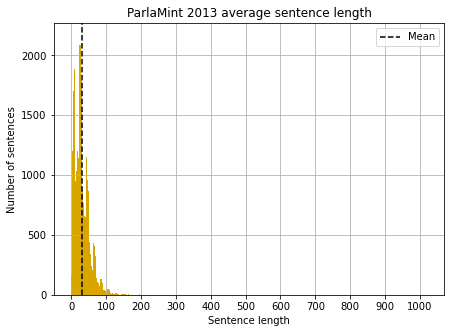

2014


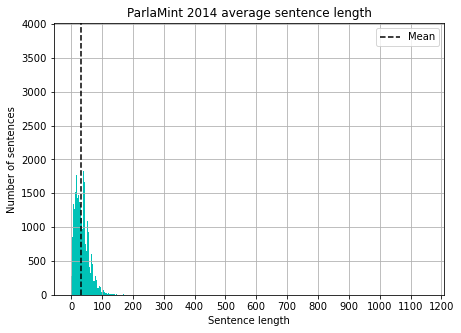

2015


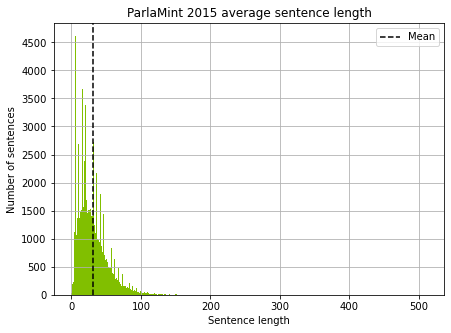

2017


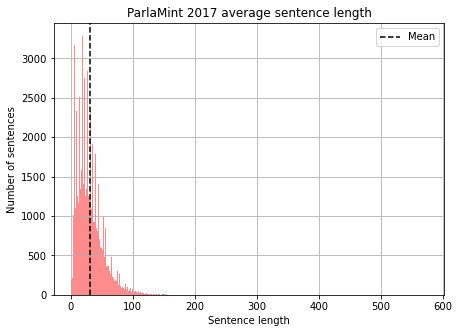

2019


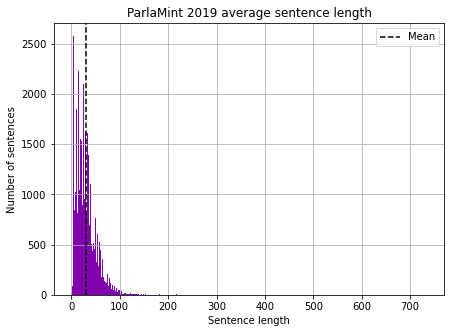

2020


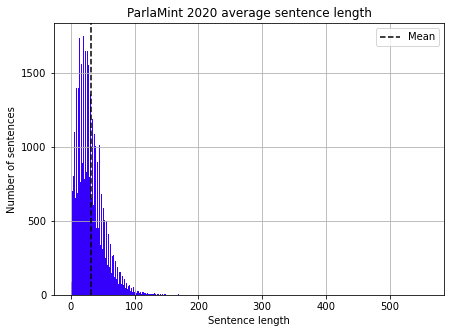

2018


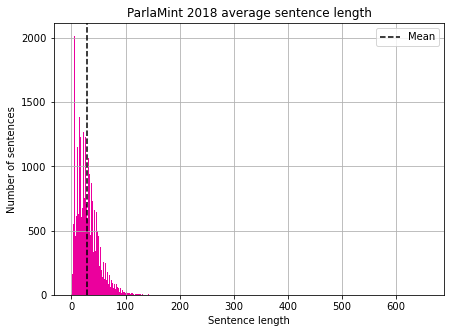

In [30]:
for anno, colore in zip(dizionario_interventi_per_anno, lista_colori):
    print(anno)
    plot_sentences_distribution_per_year(dizionario_interventi_per_anno[anno], anno, colore)
    

In [31]:
dizionario_interventi_per_anno['2013'].keys()

dict_keys(['interventi', 'lista_frasi_totali_flatten', 'lista_interventi_appartenenza'])

In [32]:
np.mean(dfh['Sentences_length'])

NameError: name 'dfh' is not defined

# Parole più frequenti

In [14]:
import string

In [9]:
dizionario_interventi_per_anno['2013']['interventi']['intervento_13']

['Signora Presidente, volevo convenire con quanto detto dai colleghi finora, perché credo valga la pena distinguere tra i veicoli di assoluta necessità per le pubbliche amministrazioni locali rispetto alle vere e proprie auto di rappresentanza.',
 "Peraltro, proprio di ieri è una mozione, sottoscritta da molti di noi, che sottolinea l'esigenza, per allineare l'Italia agli altri Paesi europei, di ridurre il numero delle auto di rappresentanza, innanzitutto facendo sì che di esse possano avvalersi solo i titolari di funzioni politiche tuttora in carica e limitando tutto ciò che è frutto invece di precedenti situazioni storiche, che si trascinano nel tempo, con costi obiettivamente inaccettabili per la pubblica amministrazione nazionale.",
 'La mia proposta emendativa 1.1 andava proprio nel senso di limitare ulteriormente la spesa per le cosiddette auto blu o comunque per le auto di rappresentanza.',
 "Anche quest'anno infatti l'acquisto di questo genere di servizi è stato importante e ma

In [10]:
punctuations = list(string.punctuation)
print(punctuations)

['!', '"', '#', '$', '%', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', ':', ';', '<', '=', '>', '?', '@', '[', '\\', ']', '^', '_', '`', '{', '|', '}', '~']


In [11]:
dizionario_testo_unificato_per_anno = {}

for anno in tqdm(dizionario_interventi_per_anno):
    
    dizionario_testo_unificato_per_anno[anno] = {}
    
    frasi_flatten = dizionario_interventi_per_anno[anno]['lista_frasi_totali_flatten']
    testo_unificato = " ".join(frasi_flatten)
    dizionario_testo_unificato_per_anno[anno]['testo_unificato'] = testo_unificato
    
    # lista di token
    tokenized_text = nltk.word_tokenize(testo_unificato)
    dizionario_testo_unificato_per_anno[anno]['testo_unificato_tokenizzato'] = tokenized_text
    
    # lista di token senza punteggiatura
    tokenized_text_no_punk = [word for word in tokenized_text if word not in punctuations]
    dizionario_testo_unificato_per_anno[anno]['testo_unificato_tokenizzato_senza_punteggiatura'] = tokenized_text_no_punk
    
    # parole piu' frequenti
    freq_dist = nltk.FreqDist(tokenized_text_no_punk)
    parole_piu_frequenti = freq_dist.most_common(50)
    
    dizionario_testo_unificato_per_anno[anno]['freq_dist'] = freq_dist
    dizionario_testo_unificato_per_anno[anno]['50_parole_piu_frequenti'] = parole_piu_frequenti

100%|█████████████████████████████████████████████| 8/8 [01:41<00:00, 12.73s/it]


In [208]:
dizionario_interventi_per_anno['2013']['interventi']['intervento_555']

['La ringrazio.']

In [221]:
for intervento in dizionario_interventi_per_anno['2020']:
    for frase in dizionario_interventi_per_anno['2020'][intervento]:
        if 'talian' in frase:
            print(frase)

Ricordo, in particolare, una sua iniziativa legislativa volta a modificare l'articolo 9 della Costituzione per introdurvi, tra i princìpi fondamentali, la tutela dell'ambiente naturale in tutte le sue forme, nella convinzione che spettasse proprio al Parlamento lanciare un messaggio forte agli italiani sull'importanza di preservare gli ecosistemi e le risorse naturali ed energetiche, anche nell'interesse delle generazioni future.
Signor Presidente, intervengo a nome del Gruppo Fratelli d'Italia e, più in generale, di chi riconosce in Giuseppe Specchia, che tutti noi conoscevamo come Pino Specchia, un protagonista della destra italiana nella sua trasformazione ed evoluzione che ha contribuito anche alla trasformazione ed evoluzione in meglio della sua Puglia e, più in generale, del nostro Paese.
Prima Maurizio Gasparri ricordava come fosse stato, Pino Specchia, collaboratore e amico di Domenico Mennitti, eletto anche lui a Brindisi, che contribuì in maniera determinante all'evoluzione d

In [194]:
from spacy.lang.it.stop_words import STOP_WORDS

In [195]:
a = nlp('Il Governo lo accoglie.')

In [200]:
for token in a:
    print(token.pos_, token.is_stop)
    if token not in exclude and token.pos_ not in removal:
        print(token.text)

DET True
NOUN True
Governo
PRON True
VERB False
PUNCT False


In [201]:
argomenti_interventi_per_anno = {}

exclude = set(string.punctuation)
removal= ['ADV','PRON','CCONJ','PUNCT','PART','DET','ADP','SPACE', 'NUM', 'SYM', 'VERB']

for anno in tqdm(dizionario_interventi_per_anno):
    argomenti_interventi_per_anno[anno] = {}
    for intervento in dizionario_interventi_per_anno[anno]['interventi']:
        argomenti_interventi_per_anno[anno][intervento] = {}
        tokens = []
        for sent in dizionario_interventi_per_anno[anno]['interventi'][intervento]:
            frase = nlp(sent)
            for token in frase:
                if token not in exclude and token.pos_ not in removal:
                    tokens.append(token.lemma_.lower())

        argomenti_interventi_per_anno[anno][intervento]['tokens'] = tokens

100%|██████████████████████████████████████████| 8/8 [1:02:21<00:00, 467.74s/it]


In [202]:
with open('{}argomenti_interventi_per_anno.pickle'.format(path_pickle), 'wb') as handle:
    pickle.dump(argomenti_interventi_per_anno, handle)

In [203]:
argomenti_interventi_per_anno.keys()

dict_keys(['2013', '2014', '2015', '2017', '2019', '2020', '2018', '2016'])

In [207]:
argomenti_interventi_per_anno['2013']['intervento_555']

{'tokens': []}

In [210]:
diz_temi_per_anno = {}

for anno in tqdm(argomenti_interventi_per_anno):
    
    diz_temi_per_anno[anno] = {}
    lista_parole_significative = []
    
    for intervento in argomenti_interventi_per_anno[anno]:
        
        if argomenti_interventi_per_anno[anno][intervento]['tokens']:
            df_temp = pd.DataFrame(columns=['tokens'])
            df_temp.at[0, 'tokens'] = argomenti_interventi_per_anno[anno][intervento]['tokens']
            #print(anno, intervento)
            #display(df_temp)
            # Add tokens to new column
            lda = gensim.models.ldamodel.LdaModel

            # Create dictionary
            # I will apply the Dictionary Object from Gensim, which maps each word to their unique ID:
            dictionary = corpora.Dictionary(df_temp['tokens'])

            # Create doc_term_matrix
            doc_term_matrix = [dictionary.doc2bow(doc) for doc in df_temp['tokens']]
            #print("Len of doc_term_matrix: {}".format(len(doc_term_matrix)))

            num_topics = 1

            # Optimal model
            lda_model = lda(doc_term_matrix, id2word=dictionary, num_topics=num_topics, passes=50)

            temi = lda_model.print_topics(num_topics)[0][1]
            lista_res = temi.split(" + ")
            lista_temi = []
            for i in lista_res:
                lista_temi.append(i.split("*"))

            parole_significative = [i[1].replace('"','') for i in lista_temi]
            lista_parole_significative.extend(parole_significative)
        
        
    diz_temi_per_anno[anno]['lista_parole_significative'] = lista_parole_significative

100%|████████████████████████████████████████████| 8/8 [34:16<00:00, 257.08s/it]


In [212]:
diz_temi_per_anno['2020']

{'lista_parole_significative': ['incarico',
  'essere',
  'senatore',
  'senato',
  'seduta',
  'resoconto',
  'odierno',
  'allegato',
  'comunicazione',
  'b',
  'regolamento',
  'votazione',
  'senso',
  'seduta',
  'richiesta',
  'articolo',
  'comma',
  'avere',
  'corso',
  'procedimento',
  'essere',
  'specchia',
  'pino',
  'avere',
  'stare',
  'legislatura',
  'senato',
  'politico',
  'commissione',
  'naturale',
  'essere',
  'avere',
  'pino',
  'destra',
  'specchia',
  'trasformazione',
  'volta',
  'amico',
  'terra',
  'primo',
  'essere',
  'avere',
  'stare',
  'territorio',
  'candidato',
  'senatore',
  'specchia',
  'politico',
  'pino',
  'riferimento',
  'relatrice',
  'orale',
  'legge',
  'sbrollini',
  'richiesta',
  'relazione',
  'osservazione',
  'ordine',
  'autorizzazione',
  'numero',
  'aperto',
  'dichiaro',
  'discussione',
  'essere',
  'facoltà',
  'generale',
  'iscritto',
  'senatore',
  'urso',
  'essere',
  'paese',
  'potere',
  'futuro',
  '

In [213]:
import collections

In [216]:
diz_temi_per_anno_counters = {}

for anno in tqdm(diz_temi_per_anno):
    diz_temi_per_anno_counters[anno] = collections.Counter(diz_temi_per_anno[anno]['lista_parole_significative'])

100%|████████████████████████████████████████████| 8/8 [00:00<00:00, 103.35it/s]


In [229]:
diz_temi_per_anno_counters['2020']

Counter({'incarico': 100,
         'essere': 2062,
         'senatore': 600,
         'senato': 419,
         'seduta': 537,
         'resoconto': 247,
         'odierno': 241,
         'allegato': 197,
         'comunicazione': 106,
         'b': 101,
         'regolamento': 264,
         'votazione': 252,
         'senso': 145,
         'richiesta': 159,
         'articolo': 188,
         'comma': 73,
         'avere': 1117,
         'corso': 58,
         'procedimento': 59,
         'specchia': 3,
         'pino': 3,
         'stare': 688,
         'legislatura': 6,
         'politico': 69,
         'commissione': 154,
         'naturale': 5,
         'destra': 3,
         'trasformazione': 3,
         'volta': 19,
         'amico': 3,
         'terra': 6,
         'primo': 42,
         'territorio': 17,
         'candidato': 2,
         'riferimento': 9,
         'relatrice': 65,
         'orale': 59,
         'legge': 444,
         'sbrollini': 6,
         'relazione': 133,
      

In [231]:
for i in diz_temi_per_anno_counters['2020']:
    if diz_temi_per_anno_counters['2020'][i] >=20:
        print(i, diz_temi_per_anno_counters['2020'][i])

incarico 100
essere 2062
senatore 600
senato 419
seduta 537
resoconto 247
odierno 241
allegato 197
comunicazione 106
b 101
regolamento 264
votazione 252
senso 145
richiesta 159
articolo 188
comma 73
avere 1117
corso 58
procedimento 59
stare 688
politico 69
commissione 154
primo 42
relatrice 65
orale 59
legge 444
relazione 133
osservazione 73
ordine 374
autorizzazione 38
numero 305
aperto 52
dichiaro 49
discussione 195
facoltà 266
generale 76
iscritto 51
paese 197
potere 521
che 1101
forza 28
opposizione 20
modo 32
presidente 702
esame 77
emendamento 268
presidenza 238
parlamentare 46
parere 224
quando 49
giorno 263
governo 315
rappresentante 149
collega 91
signore 398
favorevole 96
riformulazione 56
contrario 67
se 208
de 22
petris 22
proposta 140
senatrice 192
testo 46
atto 29
venire 33
caso 27
conforme 43
relatore 127
nominale 119
scrutinio 159
simultaneo 152
provvedimento 100
interno 21
altro 111
voto 96
problema 44
possibilità 23
perché 332
decreto 147
grande 91
ministro 312
dovere

In [161]:
prova = pd.DataFrame(columns=['tokens'])
prova.at[0, 'tokens'] = argomenti_interventi_per_anno['2020']['intervento_3091']['tokens']

In [146]:
prova

,tokens
0,"[signore, presidente, signore, onorevole, coll..."


In [169]:
# Add tokens to new column
lda = gensim.models.ldamodel.LdaModel

# Create dictionary
# I will apply the Dictionary Object from Gensim, which maps each word to their unique ID:
dictionary = corpora.Dictionary(prova['tokens'])

# Create doc_term_matrix
doc_term_matrix = [dictionary.doc2bow(doc) for doc in prova['tokens']]
print("Len of doc_term_matrix: {}".format(len(doc_term_matrix)))

num_topics = 3

# Optimal model
%time lda_model = lda(doc_term_matrix, id2word=dictionary, num_topics=num_topics, passes=100)

# Print topics
lda_model.print_topics(num_topics)

Len of doc_term_matrix: 1
CPU times: user 490 ms, sys: 6.8 ms, total: 497 ms
Wall time: 500 ms


[(0,
  '0.019*"sanitario" + 0.013*"caso" + 0.013*"gennaio" + 0.012*"coronavirus" + 0.010*"cina" + 0.010*"misura" + 0.009*"ministero" + 0.009*"salute" + 0.009*"internazionale" + 0.009*"cinese"'),
 (1,
  '0.001*"odontoiatri" + 0.001*"oggetto" + 0.001*"nucleo" + 0.001*"numeroso" + 0.001*"oc43" + 0.001*"occidentale" + 0.001*"occorrenza" + 0.001*"noto" + 0.001*"operato" + 0.001*"ordinanza"'),
 (2,
  '0.001*"odontoiatri" + 0.001*"oggetto" + 0.001*"nucleo" + 0.001*"numeroso" + 0.001*"oc43" + 0.001*"occidentale" + 0.001*"occorrenza" + 0.001*"noto" + 0.001*"operato" + 0.001*"ordinanza"')]

In [108]:
lista_dataset_token_argomenti_per_anno = {}
temi_per_anno = {}

for anno in tqdm(argomenti_interventi_per_anno):
    
    df_anno = pd.DataFrame.from_dict(argomenti_interventi_per_anno[anno], orient='index')
    
    lista_dataset_token_argomenti_per_anno[anno] = df_anno
    
    # Add tokens to new column
    lda = gensim.models.ldamodel.LdaModel

    # Create dictionary
    # I will apply the Dictionary Object from Gensim, which maps each word to their unique ID:
    dictionary = corpora.Dictionary(df_anno['tokens'])

    # Create doc_term_matrix
    doc_term_matrix = [dictionary.doc2bow(doc) for doc in df_anno['tokens']]
    print("Anno {} - len of doc_term_matrix: {}".format(anno, len(doc_term_matrix)))

    num_topics = 1

    # Optimal model
    %time lda_model = lda(doc_term_matrix, id2word=dictionary, num_topics=num_topics, passes=100)
    
    temi = lda_model.print_topics(num_topics)[0][1]
    
    lista_res = temi.split(" + ")
    
    lista_temi = []
    for i in lista_res:
        lista_temi.append(i.split("*"))
    
    lista_temi = [i[1].replace('"','') for i in lista_temi]

    temi_per_anno[anno] = lista_temi

  0%|                                                     | 0/8 [00:00<?, ?it/s]

Anno 2013 - len of doc_term_matrix: 7506


 12%|█████▌                                      | 1/8 [01:50<12:50, 110.03s/it]

CPU times: user 1min 48s, sys: 204 ms, total: 1min 49s
Wall time: 1min 49s
Anno 2014 - len of doc_term_matrix: 9753


 25%|███████████                                 | 2/8 [04:11<12:50, 128.40s/it]

CPU times: user 2min 19s, sys: 225 ms, total: 2min 20s
Wall time: 2min 19s
Anno 2015 - len of doc_term_matrix: 9201


 38%|████████████████▌                           | 3/8 [06:13<10:28, 125.72s/it]

CPU times: user 2min 1s, sys: 167 ms, total: 2min 1s
Wall time: 2min 1s
Anno 2017 - len of doc_term_matrix: 7201


 50%|██████████████████████                      | 4/8 [08:03<07:57, 119.43s/it]

CPU times: user 1min 48s, sys: 174 ms, total: 1min 48s
Wall time: 1min 48s
Anno 2019 - len of doc_term_matrix: 5367


 62%|███████████████████████████▌                | 5/8 [09:45<05:38, 112.95s/it]

CPU times: user 1min 40s, sys: 159 ms, total: 1min 40s
Wall time: 1min 40s
Anno 2020 - len of doc_term_matrix: 3331


 75%|█████████████████████████████████           | 6/8 [11:11<03:27, 103.90s/it]

CPU times: user 1min 25s, sys: 122 ms, total: 1min 25s
Wall time: 1min 25s
Anno 2018 - len of doc_term_matrix: 3650


 88%|███████████████████████████████████████▍     | 7/8 [12:36<01:37, 97.79s/it]

CPU times: user 1min 24s, sys: 133 ms, total: 1min 24s
Wall time: 1min 24s
Anno 2016 - len of doc_term_matrix: 7871


100%|████████████████████████████████████████████| 8/8 [14:52<00:00, 111.55s/it]

CPU times: user 2min 14s, sys: 180 ms, total: 2min 14s
Wall time: 2min 14s


In [109]:
temi_per_anno

{'2013': ['presidente',
  'emendamento',
  'signore',
  'dovere',
  'legge',
  'potere',
  'senatore',
  'volere',
  'ordine',
  'articolo'],
 '2014': ['emendamento',
  'presidente',
  'senatore',
  'legge',
  'potere',
  'dovere',
  'signore',
  'articolo',
  'senato',
  'volere'],
 '2015': ['emendamento',
  'presidente',
  'senatore',
  'legge',
  'potere',
  'dovere',
  'articolo',
  'senato',
  'signore',
  'volere'],
 '2017': ['presidente',
  'senatore',
  'legge',
  'emendamento',
  'dovere',
  'potere',
  'signore',
  'volere',
  'senato',
  'articolo'],
 '2019': ['emendamento',
  'presidente',
  'senatore',
  'legge',
  'senato',
  'signore',
  'votazione',
  'articolo',
  'commissione',
  'dovere'],
 '2020': ['presidente',
  'dovere',
  'potere',
  'legge',
  'signore',
  'senatore',
  'italia',
  'volere',
  'decreto',
  'collega'],
 '2018': ['emendamento',
  'presidente',
  'senatore',
  'signore',
  'commissione',
  'legge',
  'senato',
  'votazione',
  'articolo',
  'dover

In [122]:
with open('{}temi_per_anno.pickle'.format(path_pickle), 'wb') as handle:
    pickle.dump(temi_per_anno, handle)

In [70]:
df = pd.DataFrame.from_dict(argomenti_interventi, orient='index')

In [72]:
df

,tokens
intervento_0,"[elenco, senatore, congedo, assente, incarico,..."
intervento_1,"[corso, seduta, odierno, potere, votazione, pr..."
intervento_10,"[signore, presidente, pdl, parere, contrario, ..."
intervento_100,"[ritirato, comma, parere, commissione, emendam..."
intervento_1000,"[signora, presidente, dovere, provvedimento, c..."
...,...
intervento_995,"[1ᵃ, commissione, permanente, disegno, legge, ..."
intervento_996,"[parere, articolato, relatore, bisogno, valuta..."
intervento_997,"[signora, presidente, 1ᵃ, commissione, informa..."
intervento_998,"[richiesta, legittimo, commissione, bilancio, ..."


In [82]:
# Add tokens to new column
lda = gensim.models.ldamodel.LdaModel

# Create dictionary
# I will apply the Dictionary Object from Gensim, which maps each word to their unique ID:
dictionary = corpora.Dictionary(df['tokens'])

# Create doc_term_matrix
doc_term_matrix = [dictionary.doc2bow(doc) for doc in df['tokens']]
print("Len of doc_term_matrix: {}".format(len(doc_term_matrix)))

num_topics = 1

# Optimal model
%time lda_model = lda(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=100)

# Print topics
lda_model.print_topics(num_topics)

Len of doc_term_matrix: 7506
CPU times: user 33.4 s, sys: 4.93 s, total: 38.3 s
Wall time: 9.64 s


In [83]:
# Print topics
lda_model.print_topics(num_topics)

[(0,
  '0.014*"you" + 0.009*"acconto" + 0.009*"cardiochirurgia" + 0.008*"araldico" + 0.008*"casini" + 0.008*"battiato" + 0.007*"ornamentale" + 0.007*"peccato" + 0.006*"antisocialista" + 0.006*"amianto"')]

In [90]:
lda_display

PreparedData(topic_coordinates=         x    y  topics  cluster   Freq
topic                                  
0      0.0  0.0       1        1  100.0, topic_info=                    Term         Freq        Total Category  logprob  loglift
0               allegato     1.000000     1.000000  Default  30.0000     30.0
12681  antiberlusconiani     1.000000     1.000000  Default  29.0000     29.0
12301            grafico     1.000000     1.000000  Default  28.0000     28.0
12300           einstein     1.000000     1.000000  Default  27.0000     27.0
12299        compactness    28.000000    28.000000  Default  26.0000     26.0
...                  ...          ...          ...      ...      ...      ...
13751            anulare  1492.525069  1492.525069   Topic1  -5.7257     -0.0
15373          espletati  1463.636304  1463.636304   Topic1  -5.7453     -0.0
13665         giudicante  1462.673615  1462.673615   Topic1  -5.7459     -0.0
9541               razzo  1436.673982  1436.673982   Topic1  -5.7638     -0.0
12256    disaggregazione  1428.007225  1428.007225   Topic1  -5.7699     -0.0

[90 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
5899       1  0.999986      acconto
0          1  1.057845     allegato
1378       1  1.000112      amianto
39         1  1.054220    andamento
12312      1  1.057845  angosciante
...      ...       ...          ...
12319      1  1.057845     veronese
80         1  1.054220      vigente
81         1  1.049000     violenza
12295      1  1.000101   xenofobici
13233      1  1.000028          you

[90 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1])

/opt/anaconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/iterative.py:10: DeprecationWarning: Please use `LinearOperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprecated.
  from scipy.sparse.linalg.interface import LinearOperator
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:7: DeprecationWarning: Please use `asmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.sputils` namespace is deprecated.
  from scipy.sparse.sputils import asmatrix
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:9: DeprecationWarning: Please use `aslinearoperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprec

/opt/anaconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/iterative.py:10: DeprecationWarning: Please use `LinearOperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprecated.
  from scipy.sparse.linalg.interface import LinearOperator
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:7: DeprecationWarning: Please use `asmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.sputils` namespace is deprecated.
  from scipy.sparse.sputils import asmatrix
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:9: DeprecationWarning: Please use `aslinearoperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprec

In [89]:
lda_display = pyLDAvis.gensim_models.prepare(lda_model, doc_term_matrix, dictionary, sort_topics=True, mds='mmds')
pyLDAvis.display(lda_display)

In [12]:
dizionario_testo_unificato_per_anno['2013'].keys()

dict_keys(['testo_unificato', 'testo_unificato_tokenizzato', 'testo_unificato_tokenizzato_senza_punteggiatura', 'freq_dist', '50_parole_piu_frequenti'])

In [24]:
import gensim #the library for Topic modelling
from gensim.models.ldamulticore import LdaMulticore
from gensim import corpora, models
import pyLDAvis
import pyLDAvis.gensim_models #LDA visualization library
pyLDAvis.enable_notebook()
from nltk.corpus import stopwords
import string
from nltk.stem.wordnet import WordNetLemmatizer

import warnings
warnings.simplefilter('ignore')

In [14]:
dizionario_testo_unificato_per_anno['2013']['testo_unificato']

'L\'elenco dei senatori in congedo e assenti per incarico ricevuto dal Senato, nonché ulteriori comunicazioni all\'Assemblea saranno pubblicati nell\'allegato B al Resoconto della seduta odierna. Avverto che nel corso della seduta odierna potranno essere effettuate votazioni qualificate mediante il procedimento elettronico. Pertanto decorre da questo momento il termine di venti minuti dal preavviso previsto dall\'articolo 119, comma 1, del Regolamento. Nessuno al banco della Presidenza - io stavo leggendo - ha rilevato la sua richiesta. Le chiedo scusa. Magari la prossima volta formuli i suoi rilievi immediatamente, ma ora il processo verbale è già stato approvato. L\'ordine del giorno reca il seguito della discussione del disegno di legge n. 1015. Ricordo che nella seduta di ieri è stata data lettura dei pareri della 1ᵃ e dalla 5ᵃ Commissione permanente e, su richiesta del relatore, l\'Assemblea ha convenuto di rinviare il seguito della discussione alla seduta odierna. Invito il senat

In [35]:
d = {'Text_Original': " ".join(dizionario_interventi_per_anno['2013']['lista_frasi_totali_flatten'])}
df = pd.DataFrame(data=d, index=[0])

In [38]:
#clean the data
stop = set(stopwords.words('italian'))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()

def clean(text):
    stop_free = ' '.join([word for word in nltk.word_tokenize(text) if word not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = ' '.join([lemma.lemmatize(word) for word in punc_free.split()])
    return normalized.split()

In [39]:
df['Text_clean']=df['Text_Original'].apply(clean)

In [40]:
df

,Text_Original,Text_clean
0,L'elenco dei senatori in congedo e assenti per...,"[Lelenco, senatori, congedo, assenti, incarico..."


In [46]:
df['Text_clean']

0    [Lelenco, senatori, congedo, assenti, incarico...
Name: Text_clean, dtype: object

In [45]:
#create dictionary
dictionary = corpora.Dictionary(df['Text_clean'])
#Total number of non-zeroes in the BOW matrix (sum of the number of unique words per document over the entire corpus).
print(dictionary.num_nnz)

48993


In [21]:
#create document term matrix
doc_term_matrix = [dictionary.doc2bow(doc) for doc in df['Text_clean'] ]
print(len(doc_term_matrix))

1


In [22]:
lda = gensim.models.ldamodel.LdaModel

In [23]:
num_topics=1
%time ldamodel = lda(doc_term_matrix,num_topics=num_topics,id2word=dictionary,passes=50,minimum_probability=0)

CPU times: user 52.1 ms, sys: 3.28 ms, total: 55.3 ms
Wall time: 62.9 ms


In [24]:
ldamodel.print_topics(num_topics=num_topics)

[(0,
  '0.021*"auto" + 0.017*"rappresentanza" + 0.013*"amministrazioni" + 0.013*"locali" + 0.013*"stato" + 0.013*"spesa" + 0.013*"pubbliche" + 0.013*"proprio" + 0.013*"necessità" + 0.013*"credo"')]

In [29]:
topics = ldamodel.print_topics()

In [35]:
topics[0][1].split(" + ")

['0.021*"auto"',
 '0.017*"rappresentanza"',
 '0.013*"amministrazioni"',
 '0.013*"locali"',
 '0.013*"stato"',
 '0.013*"spesa"',
 '0.013*"pubbliche"',
 '0.013*"proprio"',
 '0.013*"necessità"',
 '0.013*"credo"']

In [ ]:
# Add tokens to new column
df['tokens'] = tokens

lda = gensim.models.ldamodel.LdaModel

# Create dictionary
# I will apply the Dictionary Object from Gensim, which maps each word to their unique ID:
dictionary = corpora.Dictionary(df['tokens'])

# Create corpus
corpus = [dictionary.doc2bow(doc) for doc in df['tokens']]

num_topics=5

# Optimal model
lda_model = lda(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=50)

# Print topics
lda_model.print_topics(-1)

# Visualize topics
lda_display = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_display)

Sto elaborando il testo...


In [38]:
lda_display = pyLDAvis.gensim_models.prepare(ldamodel, doc_term_matrix, dictionary, sort_topics=False, mds='mmds')
pyLDAvis.display(lda_display)

/opt/anaconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/iterative.py:10: DeprecationWarning: Please use `LinearOperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprecated.
  from scipy.sparse.linalg.interface import LinearOperator
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:7: DeprecationWarning: Please use `asmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.sputils` namespace is deprecated.
  from scipy.sparse.sputils import asmatrix
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:9: DeprecationWarning: Please use `aslinearoperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprec

/opt/anaconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/iterative.py:10: DeprecationWarning: Please use `LinearOperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprecated.
  from scipy.sparse.linalg.interface import LinearOperator
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:7: DeprecationWarning: Please use `asmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.sputils` namespace is deprecated.
  from scipy.sparse.sputils import asmatrix
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:9: DeprecationWarning: Please use `aslinearoperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprec

/opt/anaconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/iterative.py:10: DeprecationWarning: Please use `LinearOperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprecated.
  from scipy.sparse.linalg.interface import LinearOperator
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:7: DeprecationWarning: Please use `asmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.sputils` namespace is deprecated.
  from scipy.sparse.sputils import asmatrix
/opt/anaconda3/lib/python3.8/site-packages/scipy/sparse/linalg/isolve/utils.py:9: DeprecationWarning: Please use `aslinearoperator` from the `scipy.sparse.linalg` namespace, the `scipy.sparse.linalg.interface` namespace is deprec

In [71]:
import textstat

https://pypi.org/project/textstat/

**flesch_reading_ease** support italian
In the Flesch reading-ease test, higher scores indicate material that is easier to read; lower numbers mark passages that are more difficult to read.

**Gulpease Index (Italian)** Language Specific Formulas
Returns the Gulpease index of Italian text, which translates to level of education completed.
Lower scores require higher level of education to read with ease.

In [141]:
dizionario_interventi_per_anno['2013']['lista_frasi_totali_flatten'][0]

"L'elenco dei senatori in congedo e assenti per incarico ricevuto dal Senato, nonché ulteriori comunicazioni all'Assemblea saranno pubblicati nell'allegato B al Resoconto della seduta odierna."

In [142]:
text = dizionario_interventi_per_anno['2013']['lista_frasi_totali_flatten'][0]

In [180]:
textstat.set_lang('it')

In [181]:
textstat.flesch_reading_ease(text)

16.5

In [182]:
textstat.gulpease_index(text)

34.2